In [12]:
# Importing the necessary libraries.

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import sklearn 

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore") 

In [85]:
csv_file_path = 'GOES_dataset.csv'

# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Display the first few rows of the DataFrame to check if the data is loaded correctly
df.head(10)

,class,NOAA_ar_num,event_date,start_time,end_time,peak_time
0,C5.7,11067,2010-05-01,2010-05-01 01:34:00,2010-05-01 01:43:00,2010-05-01 01:39:00
1,B1.6,11064,2010-05-01,2010-05-01 05:23:00,2010-05-01 05:31:00,2010-05-01 05:27:00
2,B1.0,11067,2010-05-01,2010-05-01 09:48:00,2010-05-01 09:59:00,2010-05-01 09:52:00
3,B2.9,11067,2010-05-02,2010-05-02 06:03:00,2010-05-02 06:18:00,2010-05-02 06:09:00
4,B3.8,11067,2010-05-02,2010-05-02 10:02:00,2010-05-02 10:15:00,2010-05-02 10:09:00
5,B2.0,11063,2010-05-03,2010-05-03 12:52:00,2010-05-03 13:02:00,2010-05-03 12:57:00
6,B1.0,11066,2010-05-03,2010-05-03 21:50:00,2010-05-03 21:56:00,2010-05-03 21:53:00
7,B1.7,11068,2010-05-04,2010-05-04 04:42:00,2010-05-04 04:49:00,2010-05-04 04:46:00
8,B2.0,11069,2010-05-04,2010-05-04 11:00:00,2010-05-04 11:32:00,2010-05-04 11:18:00
9,B1.3,11069,2010-05-04,2010-05-04 12:05:00,2010-05-04 12:12:00,2010-05-04 12:09:00


In [14]:
# Last ten rows in the dataset.

df.tail(10)

,class,NOAA_ar_num,event_date,start_time,end_time,peak_time
12002,B1.1,12713,2018-06-12,2018-06-12 20:51:00,2018-06-12 20:59:00,2018-06-12 20:54:00
12003,B1.1,12713,2018-06-15,2018-06-15 06:46:00,2018-06-15 06:52:00,2018-06-15 06:49:00
12004,B1.0,12713,2018-06-15,2018-06-15 09:45:00,2018-06-15 09:50:00,2018-06-15 09:48:00
12005,B1.6,12713,2018-06-16,2018-06-16 05:16:00,2018-06-16 05:23:00,2018-06-16 05:20:00
12006,B1.0,12713,2018-06-17,2018-06-17 06:53:00,2018-06-17 07:06:00,2018-06-17 06:57:00
12007,B1.2,12713,2018-06-17,2018-06-17 13:12:00,2018-06-17 15:02:00,2018-06-17 14:29:00
12008,B1.1,12713,2018-06-17,2018-06-17 22:38:00,2018-06-17 23:06:00,2018-06-17 22:52:00
12009,B1.0,12713,2018-06-18,2018-06-18 08:40:00,2018-06-18 08:47:00,2018-06-18 08:44:00
12010,B1.0,12714,2018-06-19,2018-06-19 02:23:00,2018-06-19 02:28:00,2018-06-19 02:26:00
12011,B1.8,12714,2018-06-20,2018-06-20 00:00:00,2018-06-20 00:11:00,2018-06-20 00:06:00


In [15]:
# Basic dataset information. Float, Object and integer values.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12012 entries, 0 to 12011
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   class        12012 non-null  object
 1   NOAA_ar_num  12012 non-null  int64 
 2   event_date   12012 non-null  object
 3   start_time   12012 non-null  object
 4   end_time     12012 non-null  object
 5   peak_time    12012 non-null  object
dtypes: int64(1), object(5)
memory usage: 563.2+ KB


In [16]:
# Checking for null values. No null/missing values.

df.isnull().sum()

class          0
NOAA_ar_num    0
event_date     0
start_time     0
end_time       0
peak_time      0
dtype: int64

In [17]:
# Check for duplicates across all columns
duplicates = df.duplicated()

# Display the rows containing duplicates
print("Rows containing duplicates:")
print(df[duplicates])

Rows containing duplicates:
     class  NOAA_ar_num  event_date           start_time             end_time  \
564   B2.2         1123  2010-11-12  2010-11-12 11:43:00  2010-11-12 12:05:00   
4446  B6.7        11691  2013-03-10  2013-03-10 03:19:00  2013-03-10 03:53:00   
4447  B6.7        11691  2013-03-10  2013-03-10 03:19:00  2013-03-10 03:53:00   
5990  C2.9        11944  2014-01-04  2014-01-04 09:48:00  2014-01-04 10:03:00   
5992  M1.3        11944  2014-01-04  2014-01-04 10:16:00  2014-01-04 10:41:00   

                peak_time  
564   2010-11-12 11:57:00  
4446  2013-03-10 03:31:00  
4447  2013-03-10 03:31:00  
5990  2014-01-04 09:51:00  
5992  2014-01-04 10:25:00  


In [18]:
#number of distinct observations per group for each column
df.nunique()

class            280
NOAA_ar_num     1100
event_date      2384
start_time     11899
end_time       11895
peak_time      11879
dtype: int64

In [19]:
# Summary statistics of dataset with T referring to transpose.

df.describe().T

,count,mean,std,min,25%,50%,75%,max
NOAA_ar_num,12012.0,11833.411755,1120.516045,1089.0,11476.0,11944.0,12389.0,12714.0


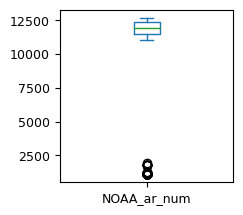

In [20]:
df.plot(kind='box', subplots=True, layout= (5,5), fontsize=9, figsize=(13,13));

In [21]:
# Calculate the IQR for each column in the DataFrame
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define a condition to identify outliers
outlier_condition = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))

# Remove rows containing outliers
df_no_outliers = df[~outlier_condition.any(axis=1)]

# Display the first few rows of the DataFrame without outliers
df_no_outliers.head()

,class,NOAA_ar_num,event_date,start_time,end_time,peak_time
0,C5.7,11067,2010-05-01,2010-05-01 01:34:00,2010-05-01 01:43:00,2010-05-01 01:39:00
1,B1.6,11064,2010-05-01,2010-05-01 05:23:00,2010-05-01 05:31:00,2010-05-01 05:27:00
2,B1.0,11067,2010-05-01,2010-05-01 09:48:00,2010-05-01 09:59:00,2010-05-01 09:52:00
3,B2.9,11067,2010-05-02,2010-05-02 06:03:00,2010-05-02 06:18:00,2010-05-02 06:09:00
4,B3.8,11067,2010-05-02,2010-05-02 10:02:00,2010-05-02 10:15:00,2010-05-02 10:09:00


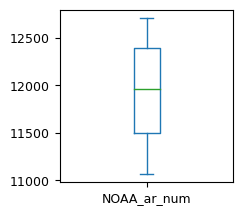

In [22]:
df_no_outliers.plot(kind='box', subplots=True, layout= (5,5), fontsize=9, figsize=(13,13));

<Axes: xlabel='NOAA_ar_num', ylabel='Count'>

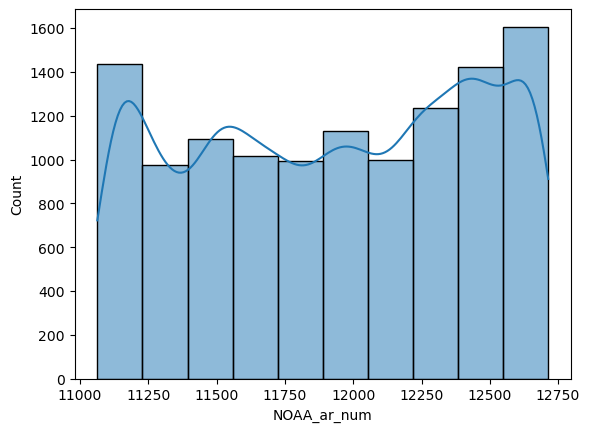

In [23]:
sns.histplot(df_no_outliers['NOAA_ar_num'], kde=True, bins=10)

<Axes: xlabel='class', ylabel='NOAA_ar_num'>

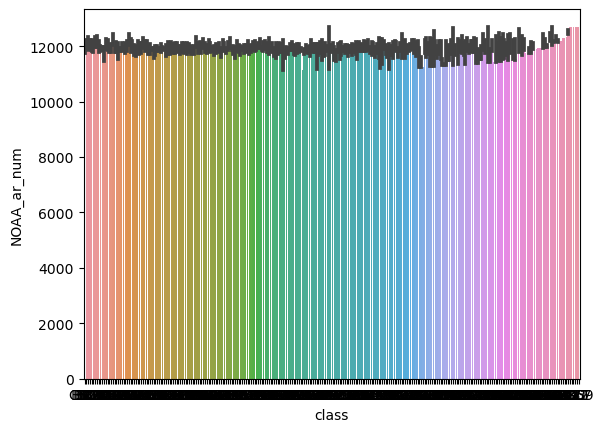

In [92]:
sns.barplot(x='class', y='NOAA_ar_num', data=df_no_outliers)

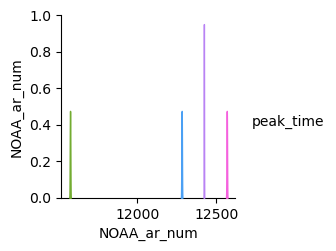

In [28]:
sns.pairplot(df_no_outliers, hue="peak_time")

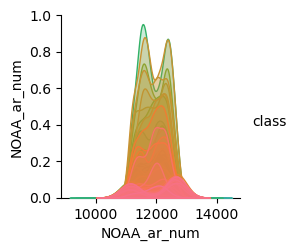

In [58]:
sns.pairplot(df_no_outliers, hue="class")

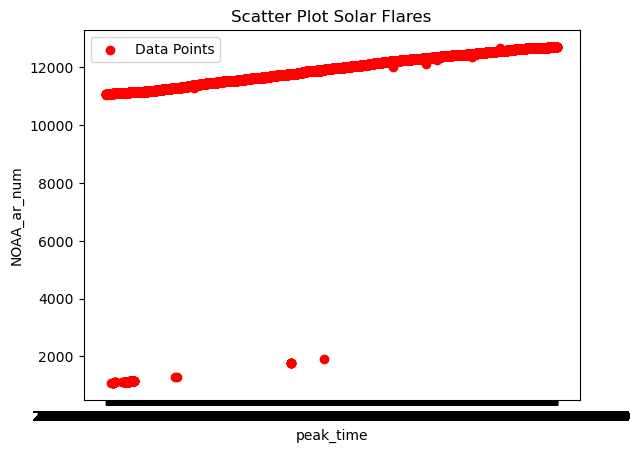

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['peak_time']
y = df['NOAA_ar_num']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('peak_time')
plt.ylabel('NOAA_ar_num')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

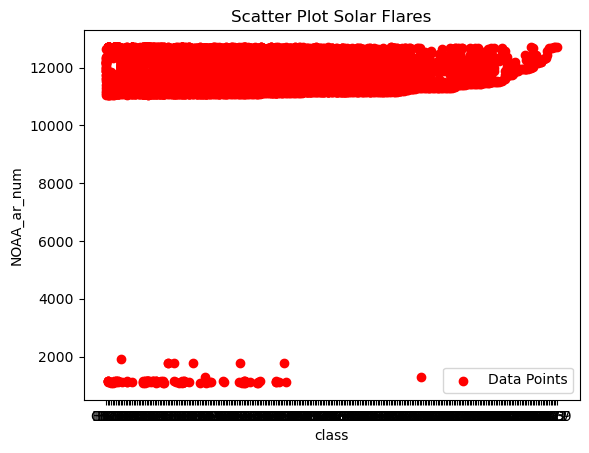

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['class']
y = df['NOAA_ar_num']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('class')
plt.ylabel('NOAA_ar_num')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

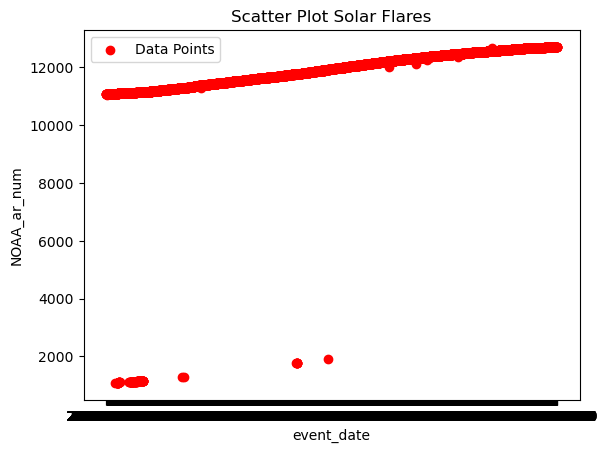

In [89]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['event_date']
y = df['NOAA_ar_num']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('event_date')
plt.ylabel('NOAA_ar_num')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

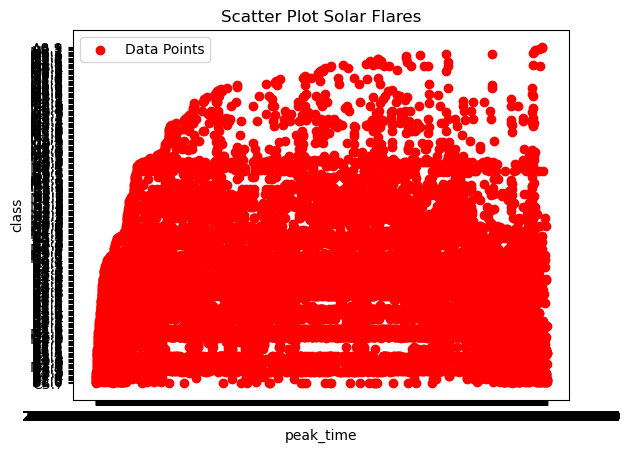

In [90]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['peak_time']
y = df['class']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('peak_time')
plt.ylabel('class')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

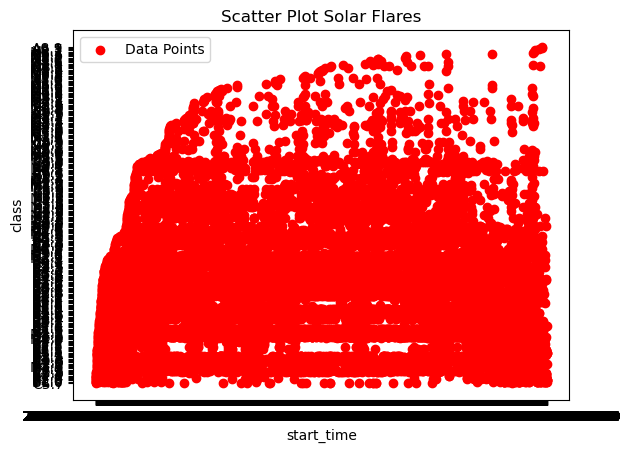

In [97]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['start_time']
y = df['class']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('start_time')
plt.ylabel('class')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

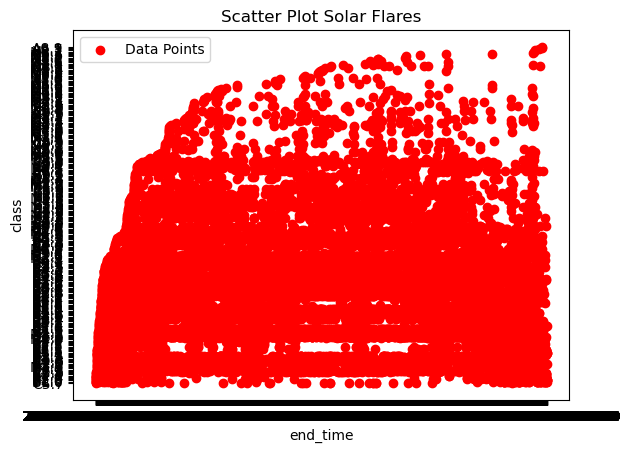

In [96]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
df = pd.read_csv(csv_file_path)

# Extract type and NOAA_ar_num values from the DataFrame
x = df['end_time']
y = df['class']


# Create a scatter plot
plt.scatter(x, y, color='red', marker='o', label='Data Points')

# Add labels and title
plt.xlabel('end_time')
plt.ylabel('class')
plt.title('Scatter Plot Solar Flares')

# Add a legend
plt.legend()

# Display the plot
plt.show()

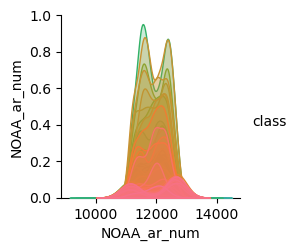

In [43]:
sns.pairplot(df_no_outliers, hue="class")

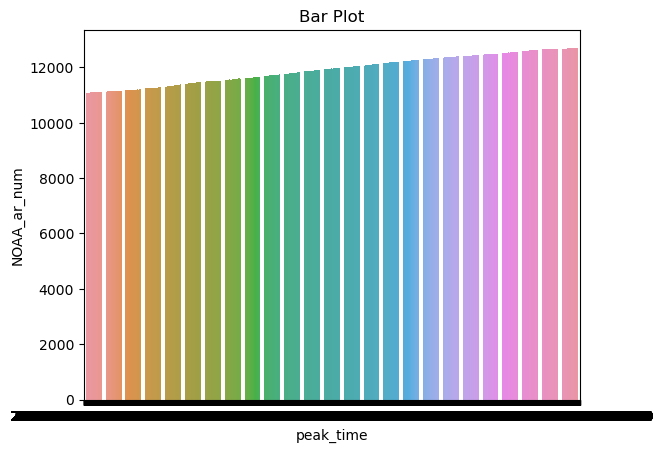

In [57]:
# Categorical Plots
sns.barplot(x='peak_time', y='NOAA_ar_num', data=df_no_outliers)
plt.title('Bar Plot')
plt.show()

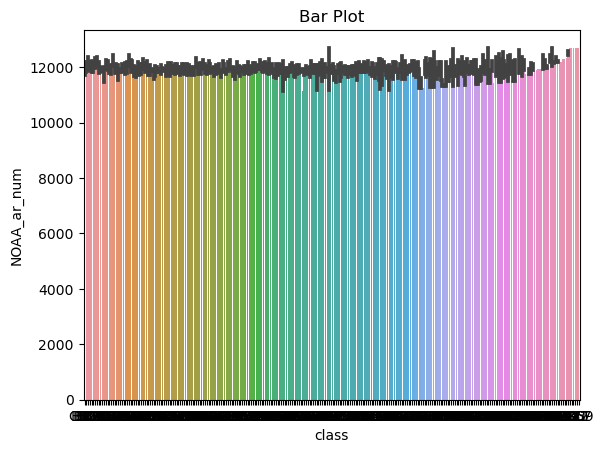

In [78]:
# Categorical Plots
sns.barplot(x='class', y='NOAA_ar_num', data=df_no_outliers)
plt.title('Bar Plot')
plt.show()

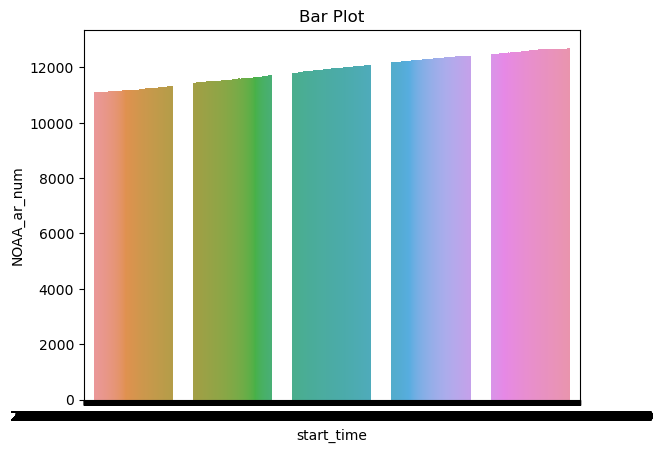

In [83]:
# Categorical Plots
sns.barplot(x='start_time', y='NOAA_ar_num', data=df_no_outliers)
plt.title('Bar Plot')
plt.show()

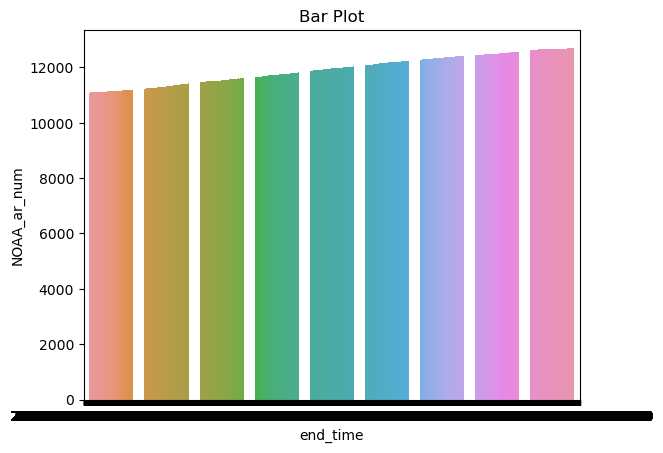

In [79]:
# Categorical Plots
sns.barplot(x='end_time', y='NOAA_ar_num', data=df_no_outliers)
plt.title('Bar Plot')
plt.show()

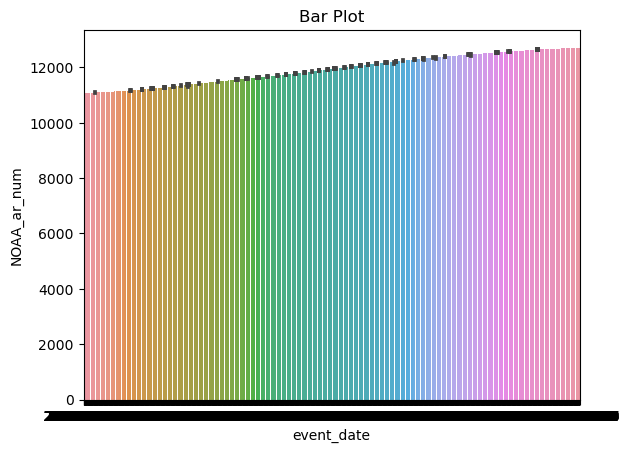

In [88]:
# Categorical Plots
sns.barplot(x='event_date', y='NOAA_ar_num', data=df_no_outliers)
plt.title('Bar Plot')
plt.show()

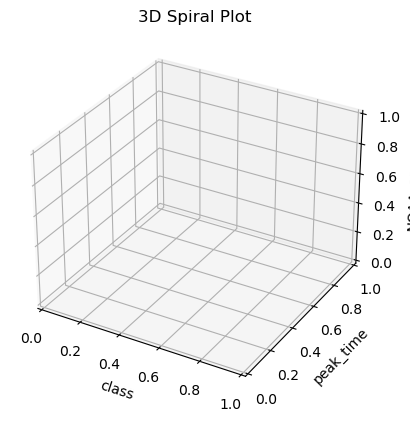

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='peak_time', z='NOAA_ar_num', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('peak_time')
ax.set_zlabel('NOAA_ar_num')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()

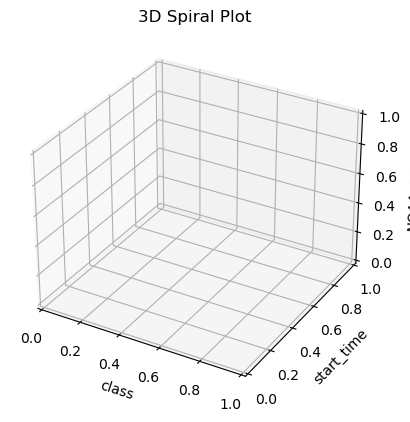

In [106]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='start_time', z='NOAA_ar_num', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('start_time')
ax.set_zlabel('NOAA_ar_num')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()

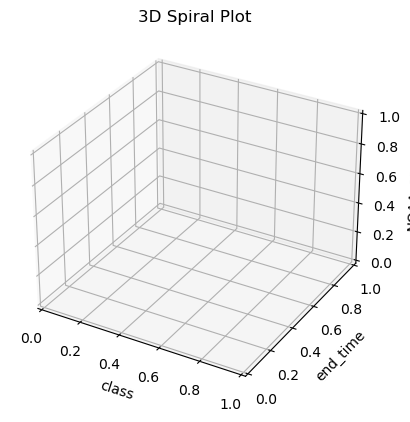

In [105]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='end_time', z='NOAA_ar_num', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('end_time')
ax.set_zlabel('NOAA_ar_num')
ax.set_title('3D Spiral Plot')


# Show the plot
plt.show()

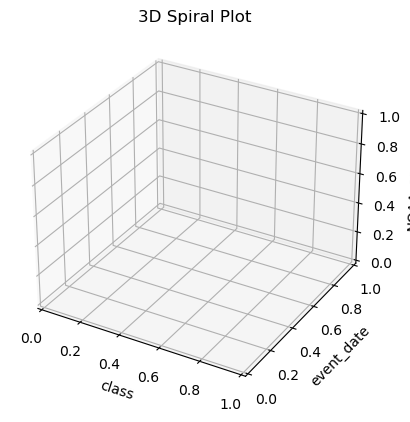

In [104]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='event_date', z='NOAA_ar_num', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('event_date')
ax.set_zlabel('NOAA_ar_num')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()

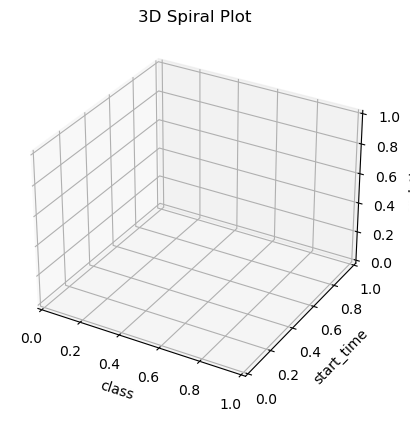

In [108]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='start_time', z='end_time', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('start_time')
ax.set_zlabel('end_time')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()

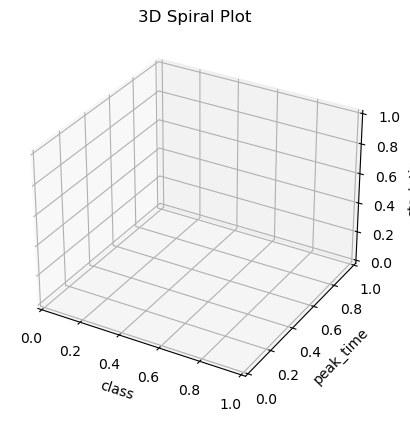

In [109]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='peak_time', z='start_time', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('peak_time')
ax.set_zlabel('start_time')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()

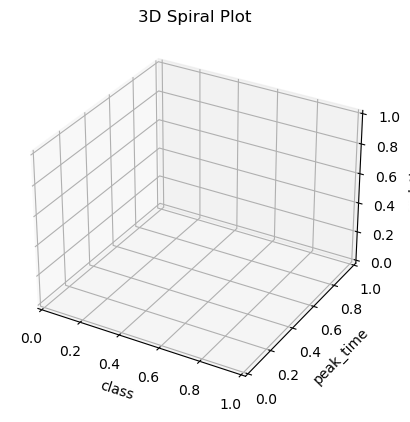

In [110]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Assuming 'df' is your DataFrame

df = pd.read_csv(csv_file_path)

# 3D Scatter plot
fig = px.scatter_3d(df, x='class', y='peak_time', z='end_time', color='class')
fig.show()

# Add labels and title
ax.set_xlabel('class')
ax.set_ylabel('peak_time')
ax.set_zlabel('end_time')
ax.set_title('3D Spiral Plot')

# Show the plot
plt.show()